# Dataframes

This notebook demonstrates how to use `cartoframes` with [GeoPandas](http://geopandas.org/), a popular Python package for working with geospatial data in a local environment. It's built on some of the same robust libraries as PostGIS which underlies CARTO's spatial analysis, so compliments CARTO extremely well.

Get started by creating a `Context` that allows you to interact with CARTO in the notebook enviroment.

In [1]:
from cartoframes.data import Dataset
from cartoframes.auth import Context, set_default_context
from cartoframes.viz import Map, Layer

import pandas
import geopandas
import descartes

set_default_context('https://cartoframes.carto.com/')

## Reading and writing data from/to CARTO

To get started, let's use the `nat` dataset which contains county-level criminology data for the United States from 1960 onwards.

In [2]:
from cartoframes.data import Dataset

dataset = Dataset.from_table('nat')
dataframe = dataset.download(decode_geom=True)

In [3]:
dataframe.head()

,geometry,name,state_name,state_fips,cnty_fips,fips,stfips,cofips,fipsno,south,...,blk80,blk90,gi59,gi69,gi79,gi89,fh60,fh70,fh80,fh90
cartodb_id,,,,,,,,,,,,,,,,,,,,,
2367,(POLYGON ((-94.81377410888672 32.9882507324218...,Titus,Texas,48.0,449.0,48449.0,48.0,449.0,48449.0,1.0,...,13.96325,13.449123,0.327824,0.396034,0.361245,0.414465,11.686904,10.4,9.476182,13.424275
2148,(POLYGON ((-93.92706298828125 34.3524627685546...,Polk,Arkansas,5.0,113.0,5113.0,5.0,113.0,5113.0,1.0,...,0.01176,0.000000,0.372180,0.387331,0.403022,0.379506,11.117861,7.3,8.862809,8.044847
16,(POLYGON ((-101.0608749389648 48.4602966308593...,Renville,North Dakota,38.0,75.0,38075.0,38.0,75.0,38075.0,0.0,...,0.00000,0.443038,0.266579,0.328074,0.351223,0.349081,9.846432,5.3,5.200000,8.517699
258,(POLYGON ((-98.72162628173828 44.8916778564453...,Faulk,South Dakota,46.0,49.0,46049.0,46.0,49.0,46049.0,0.0,...,0.00000,0.000000,0.374289,0.442518,0.418700,0.397014,9.175162,2.4,5.341880,4.325033
27,(POLYGON ((-105.8138580322266 48.5703468322753...,Daniels,Montana,30.0,19.0,30019.0,30.0,19.0,30019.0,0.0,...,0.00000,0.000000,0.272934,0.326266,0.380533,0.340827,10.276243,6.0,5.613577,8.201893


In [4]:
dataframe.head(2)[['fipsno', 'geometry']]

,fipsno,geometry
cartodb_id,,
2367,48449.0,(POLYGON ((-94.81377410888672 32.9882507324218...
2148,5113.0,(POLYGON ((-93.92706298828125 34.3524627685546...


By default, CARTO uses Well-known-binary (WKB) serialization for geometries that come out of PostGIS. 

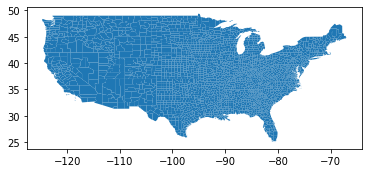

In [5]:
geodataframe = geopandas.GeoDataFrame(dataframe, geometry=dataframe.geometry)
geodataframe.plot()

These strings can be deserialized into `shapely` objects that work with GeoPandas.

This allows you to do GIS operations locally in Geopandas. To send a DataFrame with shapely geometries into a Geopandas DataFrame, you only need to call the constructor directly on the DataFrame:

The nice thing with having the code to serialize/deserialize `shapely` objects is that you can publish directly to CARTO (and make CARTO maps) directly from (geo)pandas:

In [6]:
Map(Layer(dataframe))

In [7]:
Map(Layer(dataframe, 'color: ramp($fh80, sunset)'))